# Chicago Segmentation Project

This is my IBM Data Science Capstone. I will be researching different parts of the city of Chicago with location data via Foursquare API.

# Methodology

In this project I conducted a segmentation of Chicago's 72 neighborhoods. I created KMeans Clusters in order to do this. KMeans Clustering works by creating centroid points in groups of data. These centroid points are used to bin data into clusters. The process itself works by determining which data points are closest to which centroid point. From there the data points are then placed into the appropriate cluster. While there are many applications to this technique, such as clustering customers of a certain brand so that a company can market to them accordingly, in this example I chose to use KMeans Clustering so that I could geographically visualize the differences between neighborhoods.

In order to properly engage the KMeans Clustering Methods I assembled data from a variety of sources. These included: Chicago Neighborhood Location Data, Chicago Neighborhood Demographic Data, Chicago Census Data, and Foursquare API Venue Data.

# Description of the Problem

The city of Chicago is one of the most segregated cities in the United States. Neighborhoods have strong ethnic and economic divisions. This is problematic because residents of predominately Black and Hispanic/Latino neighborhoods are far more likely to be impoverished and have less prevalence of venues that are emblematic of healthy communities. While this project does not address what those venues are, I believe that further analysis could create correlations between the presence of certain venues and the economic wellbeing of a given neighborhood. The most stark divisions are between neighborhoods in the North side of the city and those in the South side. If these neighborhoods could be segmented by their demographics, economic well-being, and presence of venues, then it is likely that both government and non-government organizations could identify nuanced solutions to addressing the needs of neighborhoods that critically require assistance. By analyzing a neighborhood map of Chicago, I will conduct this segmentation of Chicago.

# Data that will be used

I'm going to read in the economic well-being of neighborhoods throughout the city. This data can be found in a dataset from this link:

Link: https://data.cityofchicago.org/Health-Human-Services/Per-Capita-Income/r6ad-wvtk

Description of the data: This data was collected via census between 2008-2012. There are 6 categories that I will be using from this dataset. I decided not to use Percent of Housing Crowded, which is defined as percent of households that have more than 1 person per room, since I wanted to focus more on universal measures of community health.

    1. Percent households below poverty (converted to Poverty Rate)
    2. Percent aged 16+ unemployed (converted to Unofficial Unemployment Rate)
    3. Percent aged 25+ without high school diploma (converted to Non-GED)
    4. Percent aged under 18 or over 65 (converted to Percent Children or Retirement Age)
    5. Per Capita Income (left as is)
    6. Hardship Index (left as is)
    
    Note: I want to describe two of these variables since they are not intuitive. 
    
    Per Capita Income is defined as the aggregate of tract level income divided by the total population. Thus, it can be pulled down if there are large families with children.
    
    Hardship Index is the score that incorporates each of the six (I only use 5) socioeconomic indicators. 
    

I'm going to read in the demographic makeup of the neighborhoods in Chicago. This data was collected through the 2010 Census so, while it may not be completely accurate today, it should still be very relevant to the task at hand.

Linked: https://datahub.cmap.illinois.gov/dataset/2010-census-data-summarized-to-chicago-community-areas

Description of the Data: The data here gives the percent makeup of the demographics of each neighborhood.
    
    

I'm going to first make a dataframe of the neighborhoods in Chicago. I will do this by reading in a csv of Chicago neighborhoods. I had to this indirectly by running this individuals code that gave a .txt file with locations throughout the neighborhoods. I then averaged the longitudes and latitudes of the neighborhood locations to give a central point in each neighborhood. The link can be found below:

Link: https://github.com/jkgiesler/parse-chicago-neighborhoods

Description of the Data: The data here gave a list of the neighborhoods in Chicago with several longitude and latitude points. As I said, I averaged out those points to give a central location within the neighborhood.
    
Lastly, I will use the Foursquare API to determine the venues that are most present in each of these neighborhoods.

# Libraries and Imports

In [1]:
import pandas as pd
import numpy as np
import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage

from sklearn.cluster import KMeans

/Users/naasirhaleem/anaconda3/lib/python3.7/site-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.2) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


# Reading in Socioeconomic Factors in Neighborhoods

In [2]:
df = pd.read_csv('/Users/naasirhaleem/Desktop/Jupyter_Notebooks/IBM Notebooks/IBM_Capstone/Per_Capita_Income.csv')

In [3]:
df = df.rename(columns = {'COMMUNITY AREA NAME': 'Neighborhood'})

In [4]:
df.head()

,Community Area Number,Neighborhood,PERCENT OF HOUSING CROWDED,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,PER CAPITA INCOME,HARDSHIP INDEX
0,1.0,Rogers Park,7.7,23.6,8.7,18.2,27.5,23939,39.0
1,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0
2,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0
3,4.0,Lincoln Square,3.4,10.9,8.2,13.4,25.5,37524,17.0
4,5.0,North Center,0.3,7.5,5.2,4.5,26.2,57123,6.0


In [5]:
df = df.drop(columns = ['PERCENT OF HOUSING CROWDED', 'Community Area Number'])

In [6]:
df = df.rename(columns = {'PERCENT HOUSEHOLDS BELOW POVERTY':'Household Poverty Rate', 'PERCENT AGED 16+ UNEMPLOYED':'Unofficial Unemployment Rate', 'PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA': 'Non-GED','PERCENT AGED UNDER 18 OR OVER 64': 'Percent Children or Retirement Age','PER CAPITA INCOME':'Per Capita Income','HARDSHIP INDEX':'Hardship Index'})

In [7]:
df.head()

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index
0,Rogers Park,23.6,8.7,18.2,27.5,23939,39.0
1,West Ridge,17.2,8.8,20.8,38.5,23040,46.0
2,Uptown,24.0,8.9,11.8,22.2,35787,20.0
3,Lincoln Square,10.9,8.2,13.4,25.5,37524,17.0
4,North Center,7.5,5.2,4.5,26.2,57123,6.0


# Reading in Demographic Information

In [8]:
di = pd.read_csv('/Users/naasirhaleem/Desktop/Jupyter_Notebooks/IBM Notebooks/IBM_Capstone/ChicagoNeighborhoodDemographics3.csv')

In [9]:
di.head()

,Neighborhood,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino
0,Rogers Park,39.3119,26.2970,0.2582,6.4065,0.4383,2.8605,24.4276
1,West Ridge,42.6816,11.1409,0.2627,22.4959,0.3169,2.6674,20.4345
2,Uptown,51.6270,20.0046,0.3389,11.3800,0.2484,2.1912,14.2099
3,Lincoln Square,63.0897,3.7678,0.1823,11.1387,0.3520,2.3219,19.1477
4,North Center,77.3025,2.3159,0.1726,4.5470,0.2102,1.8640,13.5877


# Reading in Neighborhood Location Data

In [10]:
# Needed this initially to create a csv that was workable
#dff = pd.read_csv('/Users/naasirhaleem/Desktop/Jupyter_Notebooks/IBM Notebooks/IBM_Capstone/parsed_community_with_polygon.txt', sep = '\t', error_bad_lines = False)

In [11]:
#dff.head()

In [12]:
#chicagoneighborhoods = dff

# Saved Data to CSV File

In order to create a single longitude and latitude for each neighborhood I used SQL. I have included the SQL code below.

***SQL CODE***
select distinct(Community_Name) Neighborhood, Avg(Longitude) Longtitude, Avg(Latitude) Latitude from chicago_neighborhoods
Group by Community_Name
***************

In [13]:
# Saved it as a csv for use in SQL
#chicagoneighborhoods.to_csv(r'/Users/naasirhaleem/Desktop/Jupyter_Notebooks/IBM Notebooks/IBM_Capstone/chicago_neighborhoods.csv',index = False)

In [14]:
chicagoneighborhoodlonglat = pd.read_csv('/Users/naasirhaleem/Desktop/Jupyter_Notebooks/IBM Notebooks/IBM_Capstone/NeighborhoodLongLat.csv')

In [15]:
chicagoneighborhoodlonglat.head()

,Neighborhood,Longtitude,Latitude
0,Hyde Park,-87.589644,41.796310
1,Englewood,-87.641836,41.777340
2,Bridgeport,-87.647233,41.834999
3,Edgewater,-87.663061,41.984299
4,Albany Park,-87.719082,41.966615


# Merging Datasets Together

In [16]:
neighborhoodfull = pd.merge(df,di, on = 'Neighborhood')

In [17]:
neighborhoodfull = pd.merge(neighborhoodfull,chicagoneighborhoodlonglat, on = 'Neighborhood')

In [18]:
neighborhoodfull = neighborhoodfull.rename(columns = {'Longtitude':'Longitude'})


In [19]:
neighborhoodfull.head()

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude
0,Rogers Park,23.6,8.7,18.2,27.5,23939,39.0,39.3119,26.2970,0.2582,6.4065,0.4383,2.8605,24.4276,-87.668648,42.009120
1,West Ridge,17.2,8.8,20.8,38.5,23040,46.0,42.6816,11.1409,0.2627,22.4959,0.3169,2.6674,20.4345,-87.692394,41.999316
2,Uptown,24.0,8.9,11.8,22.2,35787,20.0,51.6270,20.0046,0.3389,11.3800,0.2484,2.1912,14.2099,-87.658792,41.966222
3,Lincoln Square,10.9,8.2,13.4,25.5,37524,17.0,63.0897,3.7678,0.1823,11.1387,0.3520,2.3219,19.1477,-87.685397,41.968844
4,North Center,7.5,5.2,4.5,26.2,57123,6.0,77.3025,2.3159,0.1726,4.5470,0.2102,1.8640,13.5877,-87.681029,41.950503


# Plotting Neighborhood Locations on Map of Chicago

In [20]:
address = 'Chicago, IL'

geolocator = Nominatim(user_agent="chicago_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Chicago, IL are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Chicago, IL are 41.8755616, -87.6244212.


In [21]:
import folium
map_chicago = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, neighborhood in zip(neighborhoodfull['Latitude'], neighborhoodfull['Longitude'], neighborhoodfull['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_chicago)  
    
map_chicago

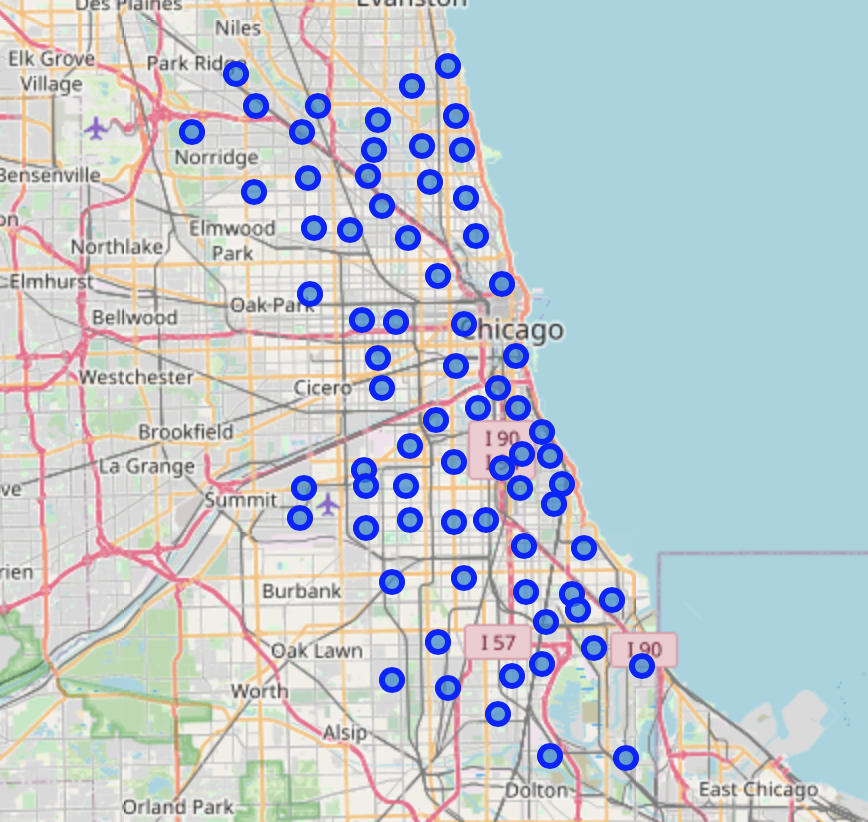

In [22]:
# Normalize Dataset
from sklearn.preprocessing import StandardScaler
ClusterPrep = neighborhoodfull.drop(columns = ['Neighborhood'])
X = ClusterPrep.values[:,1:]
X = np.nan_to_num(X)
Clus_dataSet = StandardScaler().fit_transform(X)
Clus_dataSet

array([[-0.88724317, -0.18917909, -1.20716452, ..., -0.03341469,
         0.05553647,  1.72287596],
       [-0.87405198,  0.03246407,  0.37596974, ..., -0.17570422,
        -0.29824381,  1.62390746],
       [-0.86086078, -0.73476226, -1.96994739, ..., -0.39751069,
         0.20237391,  1.28983918],
       ...,
       [-0.05619809, -0.82000963,  0.63502808, ..., -0.80602428,
         0.07242461, -1.48808872],
       [-1.09830223, -0.81148489, -0.80418489, ..., -0.56529268,
        -2.5543961 ,  1.38780338],
       [-0.82128721, -0.91378174, -1.73967332, ..., -0.31640805,
         0.13876669,  1.4723166 ]])

# Creating KMeans Clusters and Plotting on Map

Description: I chose to use KMeans Clusters in order to segment the neighborhoods of Chicago because the process will help me to spot any substantial differences between neighborhoods. This process works by creating centroid points that are determined by the data that most closely surrounds that point. Since I am using 5 different socioeconomic factors, along with longitude and latitude, the centroid points will help to bin the different neighborhoods. I have chosen to use 7 of these bins.

In [23]:
# set number of clusters
kclusters = 7

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 3, 3, 2, 2, 2, 4, 6, 3], dtype=int32)

In [24]:
neighborhoodfull.insert(0, 'Cluster Labels', kmeans.labels_)

In [25]:
neighborhoodfull.head()

,Cluster Labels,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude
0,0,Rogers Park,23.6,8.7,18.2,27.5,23939,39.0,39.3119,26.2970,0.2582,6.4065,0.4383,2.8605,24.4276,-87.668648,42.009120
1,0,West Ridge,17.2,8.8,20.8,38.5,23040,46.0,42.6816,11.1409,0.2627,22.4959,0.3169,2.6674,20.4345,-87.692394,41.999316
2,3,Uptown,24.0,8.9,11.8,22.2,35787,20.0,51.6270,20.0046,0.3389,11.3800,0.2484,2.1912,14.2099,-87.658792,41.966222
3,3,Lincoln Square,10.9,8.2,13.4,25.5,37524,17.0,63.0897,3.7678,0.1823,11.1387,0.3520,2.3219,19.1477,-87.685397,41.968844
4,2,North Center,7.5,5.2,4.5,26.2,57123,6.0,77.3025,2.3159,0.1726,4.5470,0.2102,1.8640,13.5877,-87.681029,41.950503


In [26]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, pci, cluster in zip(neighborhoodfull['Latitude'], neighborhoodfull['Longitude'], neighborhoodfull['Neighborhood'],neighborhoodfull['PER CAPITA INCOME '], neighborhoodfull['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + '\n' + 'Per Capita Income: ' + str(pci), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

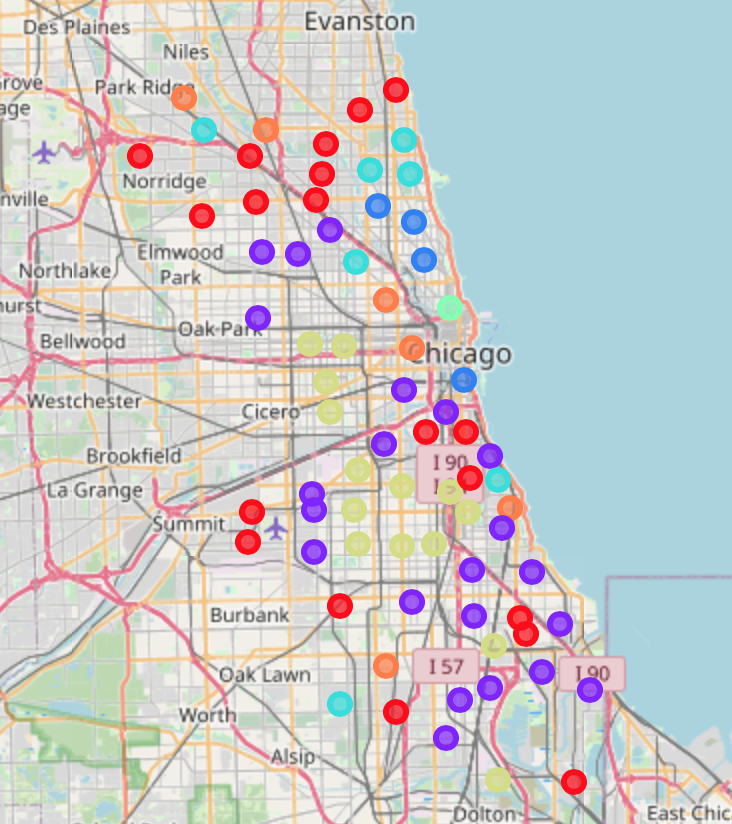

# For future reference:

Cluster 0 = Red


Cluster 1 = Purple

Cluster 2 = Blue

Cluster 3 = Light Blue

Cluster 4 = Pale Green

Cluster 5 = Olive Green

Cluster 6 = Orange

# Analysis Based on Socioeconomic/Demographic Information

<b>Analysis:</b> I can see from this map that for the most part there are clearly identifiable clusters of neighborhoods in Chicago. These are the following observations I made after briefly analyzing the map.

1: Cluster 5 is the most concentrated cluster. It is located almost entirely in the South-Western part of Chicago and, besides two neighborhoods, is located entirely south of the Eisenhower Expressway.

2: Cluster 1 and Cluster 0 both represent the greatest number of neighborhoods. They are both somewhat evenly distributed throughout the city, although Cluster 0 has a distinct northern cluster, and Cluster 1 has a defined southern cluster.

# Using FourSquare API for Clustering

Explanation: While looking at demographics and socioeconomic factors did help to segment the Chicago neighborhoods, I also want to understand if the venues present in each neighborhood differ from one another. Thus, I am going to merge this venue data with the dataframe that is in use and see if the clusters change substantially. This should help me to determine how disadvantaged communities are affected in relation to the venues that are most present within them. For a policy maker, or a non-profit organization, this could help determine what resources should be leveraged in these communities.

In [27]:
# Get Venue Data
neighborhood_latitude = neighborhoodfull.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = neighborhoodfull.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = neighborhoodfull.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Rogers Park are 42.0091201260504, -87.6686479747899.


In [28]:
CLIENT_ID = 'YS3KUM2YFZUMDBFNDOC2AJJESTXEALV1UAG3ILLUTSZRT0IB' # your Foursquare ID
CLIENT_SECRET = '04USETT1L230YOI5T5BH2CUZ4OGG1RITWYV4DE3SVLJ54DIP' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

# print('Your credentails:')
# print('CLIENT_ID: ' + CLIENT_ID)
# print('CLIENT_SECRET:' + CLIENT_SECRET)


In [29]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [31]:
LIMIT = 100
radius = 1000
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=YS3KUM2YFZUMDBFNDOC2AJJESTXEALV1UAG3ILLUTSZRT0IB&client_secret=04USETT1L230YOI5T5BH2CUZ4OGG1RITWYV4DE3SVLJ54DIP&v=20180605&ll=42.0091201260504,-87.6686479747899&radius=1000&limit=100'

In [32]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [33]:
results = requests.get(url).json()


In [34]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Morse Fresh Market,Grocery Store,42.008087,-87.667041
1,Rogers Park Social,Bar,42.007360,-87.666265
2,The Common Cup,Coffee Shop,42.007797,-87.667901
3,Lifeline Theatre,Theater,42.007372,-87.666284
4,The Glenwood,Bar,42.008502,-87.666273


In [35]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


In [36]:
chicagoneighborhood_venues = getNearbyVenues(names=neighborhoodfull['Neighborhood'],
                                   latitudes=neighborhoodfull['Latitude'],
                                   longitudes=neighborhoodfull['Longitude']
                                  )

Rogers Park
West Ridge
Uptown
Lincoln Square
North Center
Lake View
Lincoln Park
Near North Side
Edison Park
Norwood Park
Jefferson Park
Forest Glen
North Park
Albany Park
Portage Park
Irving Park
Dunning
Belmont Cragin
Hermosa
Avondale
Logan Square
West Town
Austin
West Garfield Park
East Garfield Park
Near West Side
North Lawndale
South Lawndale
Lower West Side
Near South Side
Armour Square
Douglas
Oakland
Fuller Park
Grand Boulevard
Kenwood
Washington Park
Hyde Park
Woodlawn
South Shore
Chatham
Avalon Park
South Chicago
Burnside
Calumet Heights
Roseland
Pullman
South Deering
East Side
West Pullman
Riverdale
Hegewisch
Garfield Ridge
Archer Heights
Brighton Park
McKinley Park
Bridgeport
New City
West Elsdon
Gage Park
Clearing
West Lawn
Chicago Lawn
West Englewood
Englewood
Greater Grand Crossing
Ashburn
Auburn Gresham
Beverly
Mount Greenwood
Morgan Park
O'Hare
Edgewater


In [37]:
print('There are {} uniques categories.'.format(len(chicagoneighborhood_venues['Venue Category'].unique())))

There are 336 uniques categories.


# One Hot Encoding the Venues

Explanation: This will help to rank how many of these venues are present in each neighborhood

In [38]:
# one hot encoding
chicagoneighborhood_onehot = pd.get_dummies(chicagoneighborhood_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
chicagoneighborhood_onehot['Neighborhood'] = chicagoneighborhood_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [chicagoneighborhood_onehot.columns[-1]] + list(chicagoneighborhood_onehot.columns[:-1])
chicagoneighborhood_onehot = chicagoneighborhood_onehot[fixed_columns]

chicagoneighborhood_onehot.head()

,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,American Restaurant,Antique Shop,...,Video Store,Vietnamese Restaurant,Warehouse Store,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [39]:
chicagoneighborhood_grouped = chicagoneighborhood_onehot.groupby('Neighborhood').mean().reset_index()
chicagoneighborhood_grouped.head()

,Neighborhood,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,American Restaurant,...,Video Store,Vietnamese Restaurant,Warehouse Store,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store
0,Albany Park,0.0,0.0,0.010309,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.010309,0.010309,0.0,0.0,0.0,0.0,0.0,0.0,0.020619,0.0
1,Archer Heights,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.018519,...,0.037037,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,Armour Square,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,Ashburn,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.125000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,Auburn Gresham,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.130435,...,0.043478,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [40]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

I'm going to limit the number of venues listed to 5.

In [41]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = chicagoneighborhood_grouped['Neighborhood']

for ind in np.arange(chicagoneighborhood_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(chicagoneighborhood_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Albany Park,Mexican Restaurant,Discount Store,Sandwich Place,Chinese Restaurant,Donut Shop
1,Archer Heights,Mexican Restaurant,Bank,Mobile Phone Shop,Bar,Pizza Place
2,Armour Square,Chinese Restaurant,Dessert Shop,Pizza Place,Grocery Store,Bakery
3,Ashburn,Fast Food Restaurant,Bank,Hot Dog Joint,American Restaurant,Grocery Store
4,Auburn Gresham,American Restaurant,Pharmacy,Fast Food Restaurant,Discount Store,Park


# Merging One Hot Encoded Dataframe with Demographic/Socioeconomic Dataframe

Explanation: I am making a separate dataframe here for use in Clustering. This way I can easily manipulate the original dataframe and merge the sorted venues dataframe with it after the KMeans clustering process.

In [42]:
neighborhoodfull2 = pd.merge(neighborhoodfull,chicagoneighborhood_grouped, on = 'Neighborhood')

In [43]:
neighborhoodfull2 = neighborhoodfull2.drop(columns = ['Cluster Labels'])

In [44]:
# Normalize Dataset
from sklearn.preprocessing import StandardScaler
ClusterPrep = neighborhoodfull2.drop(columns = ['Neighborhood'])
X = ClusterPrep.values[:,1:]
X = np.nan_to_num(X)
Clus_dataSet = StandardScaler().fit_transform(X)
Clus_dataSet

array([[-0.88724317, -0.18917909, -1.20716452, ..., -0.11785113,
        -0.42538719, -0.26655961],
       [-0.87405198,  0.03246407,  0.37596974, ..., -0.11785113,
        -0.42538719, -0.26655961],
       [-0.86086078, -0.73476226, -1.96994739, ..., -0.11785113,
         0.49386831, -0.26655961],
       ...,
       [-0.05619809, -0.82000963,  0.63502808, ..., -0.11785113,
        -0.42538719, -0.26655961],
       [-1.09830223, -0.81148489, -0.80418489, ..., -0.11785113,
        -0.42538719, -0.26655961],
       [-0.82128721, -0.91378174, -1.73967332, ..., -0.11785113,
        -0.42538719, -0.26655961]])

In [45]:
# set number of clusters
kclusters = 7

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 3, 3, 2, 2, 2, 4, 6, 3], dtype=int32)

# Merging Cluster Labels with Prior Dataframe and Dropping Current Cluster Labels

Explanation: In case any of the Cluster Labels changed in this process, I want to be sure that I drop the previous Cluster Labels, and add the new ones.

In [46]:
neighborhoodfull2.insert(0, 'Cluster Labels', kmeans.labels_)

In [47]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, pci, cluster in zip(neighborhoodfull2['Latitude'], neighborhoodfull2['Longitude'], neighborhoodfull2['Neighborhood'],neighborhoodfull2['PER CAPITA INCOME '], neighborhoodfull2['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + '\n' + 'Per Capita Income: ' + str(pci), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

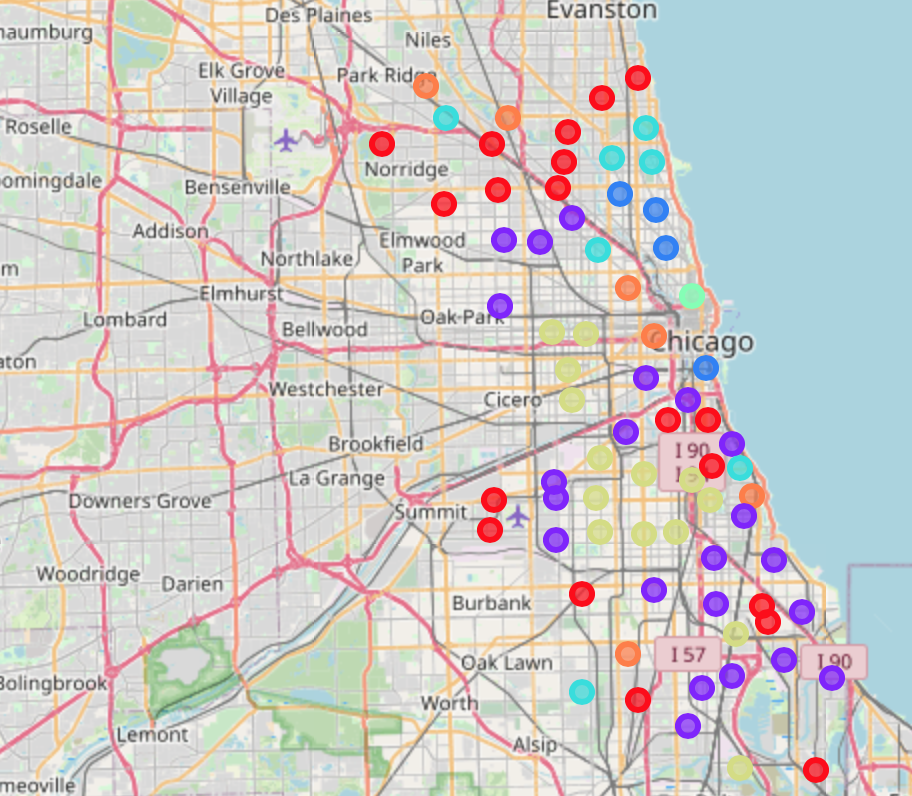

# For future reference:

Cluster 0 = Red

Cluster 1 = Purple

Cluster 2 = Blue

Cluster 3 = Light Blue

Cluster 4 = Pale Green

Cluster 5 = Olive Green

Cluster 6 = Orange

# Analysis with Venue Information Merged with Socioeconomic/Demographic Information

<b> Analysis:</b> There does not seem to be a dramatic difference in the clusters after running the KMeans clusters with the venue information. This seems promising and I will now dive into each of the clusters below.

<b> Summary: </b> I chose to use several classifications in order to create definitions for each clusters. The purpose of this is to clearly communicate my interpretation of the data that pertains to each cluster.

1. Wealth of Cluster (Determined by Per Capita Income)

    a. Lower Class: Per Capita Income < 25000 
     
    b. Middle Class: 25000 < Per Capita Income < 42000
     
    c. Upper Class: Per Capita Income > 42000
    

2. Demographic Makeup of Cluster (Determined by Demographic Data)
    
    a. Race Specific: Race > 50%
    
    b. Diverse: If no Race consists of > 50% of population
    

3. Need for Assistance (Determined by Hardship Index)
    
    a. None: Hardship Index < 5%
    
    b. Low: 5% < Hardship Index < 25%
    
    c. Moderate: 25% < Hardship Index < 40%
    
    d. High: 40% < Hardship Index < 60%
   
    e. Critical: Hardship Index > 60%
   

4. Geographic Constraint (Spatially Determined)

   a. North Side
   
   b. South Side
   
   c. No Constraint

# Finding Centroid Points of Each Neighborhood

Explanation: I want to ensure that it is clear how each Cluster was segmented and what exactly the centroid points were in the process.

In [48]:
neighborhoodfull = neighborhoodfull2.iloc[0:73,0:17]

In [49]:
nf5 = neighborhoodfull.groupby('Cluster Labels').mean()

In [50]:
nf5 = nf5.drop(columns = ['Longitude', 'Latitude'])

In [51]:
Cluster_Labels = [0,1,2,3,4,5,6]

In [52]:
nf5['Cluster Labels'] = Cluster_Labels

In [53]:
nf5

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
0,15.652632,12.836842,17.278947,35.926316,24968.210526,37.631579,37.584242,28.214289,0.172263,8.047121,0.194421,1.581342,24.206284,0
1,24.740909,18.463636,25.954545,38.468182,17153.227273,64.863636,8.871855,49.869332,0.151605,4.682182,0.111095,0.878377,35.435555,1
2,11.250000,4.975000,4.525000,21.625000,61952.250000,5.000000,72.154100,9.649800,0.114400,7.784650,0.226775,1.969175,8.101075,2
3,14.342857,9.700000,10.971429,29.914286,34538.714286,20.285714,56.063986,17.277600,0.180914,6.767100,0.236114,1.852357,17.621900,3
4,12.900000,7.000000,2.500000,22.600000,88669.000000,1.000000,72.105000,10.849400,0.098200,10.113800,0.233600,1.662400,4.937600,4
5,37.542857,23.871429,32.221429,41.857143,11837.500000,89.357143,2.955629,68.149436,0.113621,0.613193,0.074507,0.734379,27.359243,5
6,11.600000,7.833333,7.133333,31.066667,41931.500000,11.666667,61.287650,17.479667,0.117467,7.417750,0.212483,2.077917,11.407067,6


In [54]:
neighborhoodfull = pd.merge(neighborhoodfull, neighborhoods_venues_sorted, on = 'Neighborhood')

# Cluster 0 Analysis

<b> Analysis: </b> Cluster 0 does not appear to be geographically constrained. There is a strong presence in both the North Side and the South Side. The Per Capita Income does indicate that the cluster is just on the border of Middle and Lower Class.

<b> Additional Analysis: </b>

1. Cluster 0 is extremely diverse with Whites comprising ~38% of the population, Blacks making up ~28%, and Hispanics/Latinos encompassing ~24%.

<b> Cluster Definition: </b> 

I would define Cluster 0 as Lower/Middle Class, Diverse, in Moderate Need, and no Geographic Constraint


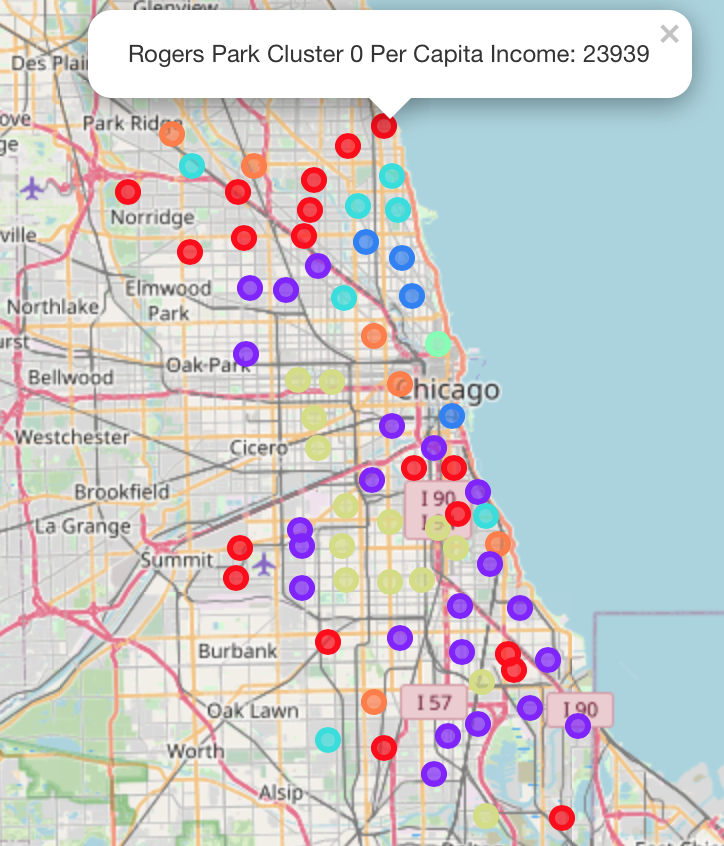

In [55]:
nf5.loc[nf5['Cluster Labels']==0,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
0,15.652632,12.836842,17.278947,35.926316,24968.210526,37.631579,37.584242,28.214289,0.172263,8.047121,0.194421,1.581342,24.206284,0


In [56]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 0, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Rogers Park,23.6,8.7,18.2,27.5,23939,39.0,39.3119,26.2970,0.2582,...,0.4383,2.8605,24.4276,-87.668648,42.009120,Mexican Restaurant,Beach,Sandwich Place,Bar,Park
1,West Ridge,17.2,8.8,20.8,38.5,23040,46.0,42.6816,11.1409,0.2627,...,0.3169,2.6674,20.4345,-87.692394,41.999316,Indian Restaurant,Pakistani Restaurant,Grocery Store,Fast Food Restaurant,Korean Restaurant
10,Jefferson Park,8.6,12.4,13.4,35.5,27751,25.0,68.6694,1.0413,0.2790,...,0.1690,1.6151,19.3610,-87.768720,41.976116,Convenience Store,Bar,Train Station,Park,American Restaurant
12,North Park,13.2,9.9,14.4,39.0,26576,33.0,49.3391,3.1956,0.2342,...,0.4796,3.1175,17.9800,-87.716169,41.982231,Bus Station,Coffee Shop,Hookah Bar,Korean Restaurant,Park
13,Albany Park,19.2,10.0,32.9,32.0,21323,53.0,29.2072,4.0278,0.2309,...,0.3512,2.3185,49.4490,-87.719082,41.966615,Mexican Restaurant,Discount Store,Sandwich Place,Chinese Restaurant,Donut Shop
14,Portage Park,11.6,12.6,19.3,34.0,24336,35.0,53.5353,1.3349,0.1669,...,0.2121,1.3458,38.7702,-87.763739,41.952785,Italian Restaurant,Pizza Place,Mexican Restaurant,Gas Station,Liquor Store
15,Irving Park,13.1,10.0,22.4,31.6,27249,34.0,41.6687,3.2534,0.2324,...,0.2568,1.9865,45.6006,-87.722893,41.953096,Sandwich Place,Bus Station,Italian Restaurant,Convenience Store,Bar
16,Dunning,10.6,10.0,16.2,33.6,26282,28.0,70.3806,0.7345,0.0954,...,0.1288,1.0350,23.8410,-87.801390,41.945667,Fast Food Restaurant,Italian Restaurant,Pizza Place,Automotive Shop,Ice Cream Shop
31,Douglas,29.6,18.2,14.3,30.7,23791,47.0,9.9243,72.6341,0.2248,...,0.1316,1.8533,2.5496,-87.620010,41.834531,Sandwich Place,Fast Food Restaurant,Shipping Store,Park,Pizza Place
34,Grand Boulevard,29.3,24.3,15.9,39.5,23472,57.0,1.7830,94.1447,0.1505,...,0.0958,1.7648,1.8013,-87.617987,41.810951,Fast Food Restaurant,Bus Station,Art Gallery,Deli / Bodega,Boutique


In [57]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 0, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Rogers Park,Mexican Restaurant,Beach,Sandwich Place,Bar,Park
1,West Ridge,Indian Restaurant,Pakistani Restaurant,Grocery Store,Fast Food Restaurant,Korean Restaurant
10,Jefferson Park,Convenience Store,Bar,Train Station,Park,American Restaurant
12,North Park,Bus Station,Coffee Shop,Hookah Bar,Korean Restaurant,Park
13,Albany Park,Mexican Restaurant,Discount Store,Sandwich Place,Chinese Restaurant,Donut Shop
14,Portage Park,Italian Restaurant,Pizza Place,Mexican Restaurant,Gas Station,Liquor Store
15,Irving Park,Sandwich Place,Bus Station,Italian Restaurant,Convenience Store,Bar
16,Dunning,Fast Food Restaurant,Italian Restaurant,Pizza Place,Automotive Shop,Ice Cream Shop
31,Douglas,Sandwich Place,Fast Food Restaurant,Shipping Store,Park,Pizza Place
34,Grand Boulevard,Fast Food Restaurant,Bus Station,Art Gallery,Deli / Bodega,Boutique


# Cluster 1 Analysis

<b> Analysis:</b> There are similarities between Cluster 1 and Cluster 5. Both clusters have Per Capita Income that is within $6000 of each other. Additionally, both clusters are more likely to be present in the South Side versus being found in the North Side.

<b> Additional Observations: </b> 

1. Cluster 1 is predominately Black, with Hispanics or Latinos making up the other significant ethnicity in the cluster.

2. Similarily to Cluster 5, the Percent of Children or Retired Adults is fairly high as compared to other clusters.

<b> Cluster Definition </b>:

I would define Cluster 1 as being Lower Class, Black/Hispanic or Latino, in High Need, South Side

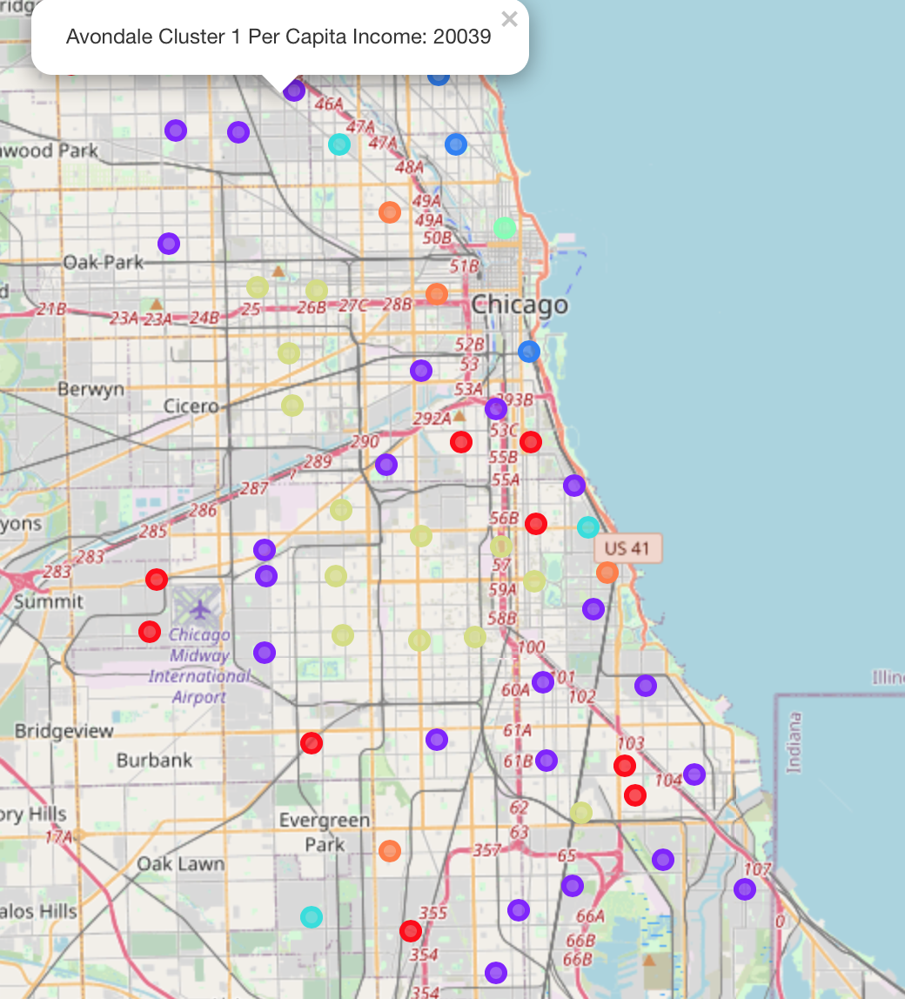

In [58]:
nf5.loc[nf5['Cluster Labels']==1,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
1,24.740909,18.463636,25.954545,38.468182,17153.227273,64.863636,8.871855,49.869332,0.151605,4.682182,0.111095,0.878377,35.435555,1


In [59]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 1, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
17,Belmont Cragin,18.7,14.6,37.3,37.3,15461,70.0,15.1874,3.1660,0.0940,...,0.2019,0.5334,78.8654,-87.760295,41.926326,Mexican Restaurant,Pharmacy,Donut Shop,Restaurant,Grocery Store
18,Hermosa,20.5,13.1,41.6,36.4,15089,71.0,7.6489,3.0268,0.0640,...,0.1519,0.5278,87.4050,-87.735568,41.925624,Mexican Restaurant,Pizza Place,Discount Store,Grocery Store,Sandwich Place
19,Avondale,15.3,9.2,24.7,31.0,20039,42.0,28.4397,2.5241,0.1757,...,0.2369,1.1563,64.4262,-87.713286,41.938105,Bar,Donut Shop,Mexican Restaurant,Sandwich Place,Ice Cream Shop
22,Austin,28.6,22.6,24.4,37.9,15957,73.0,4.4298,85.1016,0.1634,...,0.0751,0.7948,8.8536,-87.762589,41.893204,Discount Store,Bus Station,Train Station,Grocery Store,Sandwich Place
28,Lower West Side,25.8,15.8,40.7,32.6,16444,76.0,12.4326,3.0977,0.1398,...,0.1258,0.7325,82.4345,-87.663159,41.855830,Mexican Restaurant,Bakery,Pizza Place,Bar,Latin American Restaurant
30,Armour Square,40.1,16.7,34.5,38.3,16148,82.0,12.2620,10.5967,0.0299,...,0.0224,1.0305,3.4650,-87.633735,41.844592,Chinese Restaurant,Dessert Shop,Pizza Place,Grocery Store,Bakery
32,Oakland,39.7,28.7,18.4,40.4,19252,78.0,2.0615,94.0689,0.2873,...,0.1690,1.3518,1.4701,-87.603023,41.822099,Park,Beach,Discount Store,BBQ Joint,Juice Bar
38,Woodlawn,30.7,23.4,16.5,36.1,18672,58.0,6.8366,86.7944,0.1348,...,0.1095,1.7102,2.1230,-87.595283,41.785896,Coffee Shop,Sandwich Place,Bookstore,Park,Café
39,South Shore,31.1,20.0,14.0,35.7,19398,55.0,1.3920,94.8625,0.2500,...,0.1615,1.3786,1.7170,-87.574549,41.763049,Chinese Restaurant,Seafood Restaurant,Coffee Shop,Pizza Place,Bank
40,Chatham,27.8,24.0,14.5,40.3,18881,60.0,0.3610,97.2025,0.2224,...,0.0838,1.0410,1.0023,-87.614071,41.740950,Fast Food Restaurant,Sandwich Place,Chinese Restaurant,Fried Chicken Joint,Discount Store


In [60]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 1, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
17,Belmont Cragin,Mexican Restaurant,Pharmacy,Donut Shop,Restaurant,Grocery Store
18,Hermosa,Mexican Restaurant,Pizza Place,Discount Store,Grocery Store,Sandwich Place
19,Avondale,Bar,Donut Shop,Mexican Restaurant,Sandwich Place,Ice Cream Shop
22,Austin,Discount Store,Bus Station,Train Station,Grocery Store,Sandwich Place
28,Lower West Side,Mexican Restaurant,Bakery,Pizza Place,Bar,Latin American Restaurant
30,Armour Square,Chinese Restaurant,Dessert Shop,Pizza Place,Grocery Store,Bakery
32,Oakland,Park,Beach,Discount Store,BBQ Joint,Juice Bar
38,Woodlawn,Coffee Shop,Sandwich Place,Bookstore,Park,Café
39,South Shore,Chinese Restaurant,Seafood Restaurant,Coffee Shop,Pizza Place,Bank
40,Chatham,Fast Food Restaurant,Sandwich Place,Chinese Restaurant,Fried Chicken Joint,Discount Store


# Cluster 2 Analysis

<b> Analysis: </b> It is immediately apparent that Cluster 2 is substantially different than most of the other neighborhoods. The Per Capita Income is around $62000 and the Unemployment Rate is extremely low at around 5 percent. There is also significant geographic restraint in play, as neighborhoods that fall into Cluster 2 are close to the lake and are for the most part in the northern side of the city. Cluster 2 can be characterized as Upper Class.

<b> Additional Analysis </b>: 

1. The demographics of Cluster 2 swing heavily toward Whites, who make up 72 percent of the Cluster. Blacks, Asians, Hispanics or Latinos, encompass the other 28 percent at a relatively similar rate. This may back up the noted lack of ethnic restaurants.

2. Cluster 2 has the highest rate of working age adults at almost 80 percent of the population. These are also educated individuals where over 95 percent have at least a GED. 

<b> Cluster Definition: </b>

I would define Cluster 2 as Upper Class, White, in no Need, and North Side

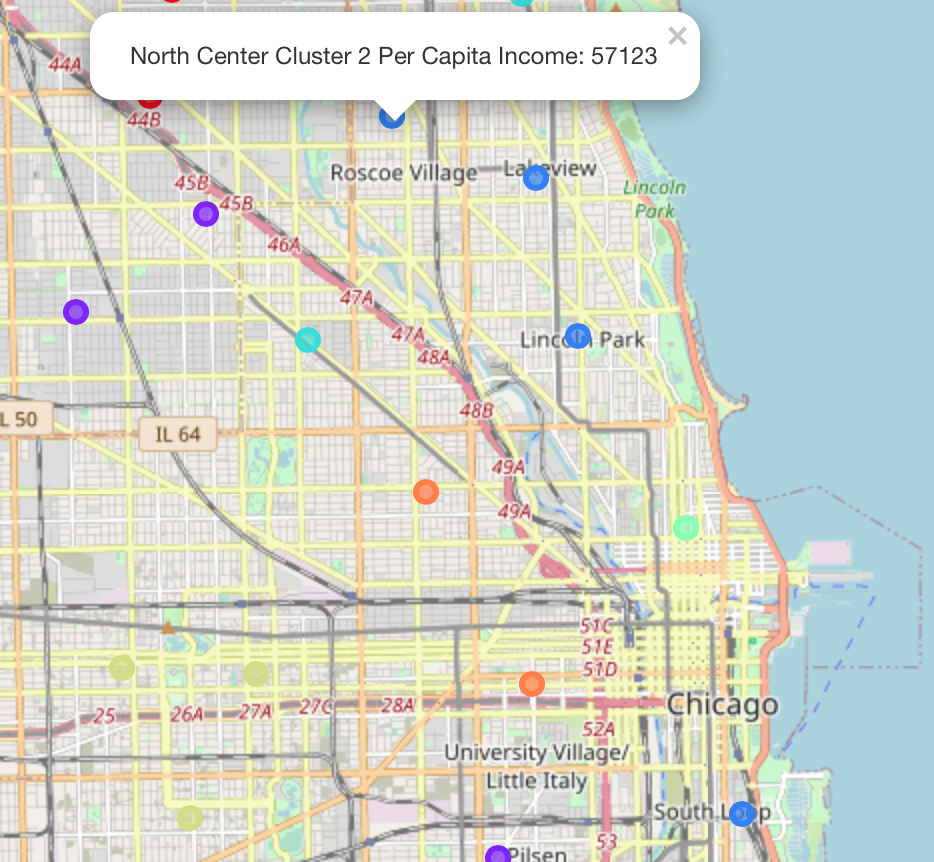

In [61]:
nf5.loc[nf5['Cluster Labels']==2,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
2,11.25,4.975,4.525,21.625,61952.25,5.0,72.1541,9.6498,0.1144,7.78465,0.226775,1.969175,8.101075,2


In [62]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 2, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,North Center,7.5,5.2,4.5,26.2,57123,6.0,77.3025,2.3159,0.1726,...,0.2102,1.8640,13.5877,-87.681029,41.950503,Bar,Coffee Shop,Pizza Place,Brewery,Salon / Barbershop
5,Lake View,11.4,4.7,2.6,17.0,60058,5.0,80.3715,3.8689,0.1166,...,0.1950,1.8301,7.6276,-87.656409,41.942514,Coffee Shop,Sports Bar,Sandwich Place,Bakery,Ice Cream Shop
6,Lincoln Park,12.3,5.1,3.6,21.5,71551,2.0,82.8779,4.2938,0.0842,...,0.2074,1.8264,5.5696,-87.649348,41.922431,Coffee Shop,Pizza Place,Italian Restaurant,Sushi Restaurant,Hot Dog Joint
29,Near South Side,13.8,4.9,7.4,21.8,59077,7.0,48.0645,28.1206,0.0842,...,0.2945,2.3562,5.6194,-87.621089,41.861337,Aquarium,Park,Grocery Store,Historic Site,History Museum


In [63]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 2, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,North Center,Bar,Coffee Shop,Pizza Place,Brewery,Salon / Barbershop
5,Lake View,Coffee Shop,Sports Bar,Sandwich Place,Bakery,Ice Cream Shop
6,Lincoln Park,Coffee Shop,Pizza Place,Italian Restaurant,Sushi Restaurant,Hot Dog Joint
29,Near South Side,Aquarium,Park,Grocery Store,Historic Site,History Museum


# Cluster 3 Analysis

<b> Analysis: </b> There does not appear to be any geographic constraint on Cluster 3 other than being more likely to be in the North Side. The Per Capita Income is Middle Class.

<b> Additional Analysis: </b>

1. Cluster 3 is very similar to Cluster 6 other than the rather large difference in Per Capita Income.

<b> Cluster Definition: </b>

I would define this Cluster as being Middle Class, White (Slightly more diverse than Cluster 2, 4, and 6), in Low Need, and North Side

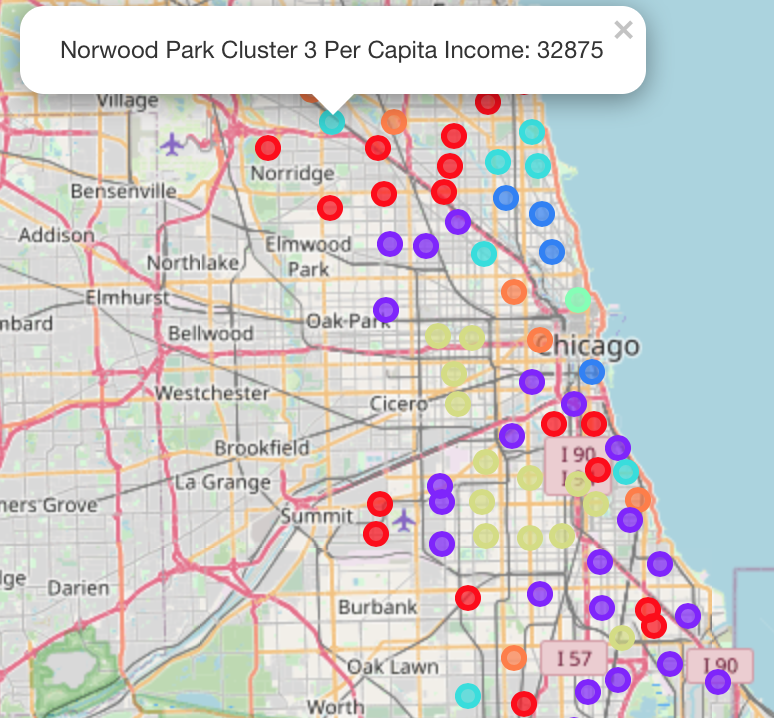

In [64]:
nf5.loc[nf5['Cluster Labels']==3,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
3,14.342857,9.7,10.971429,29.914286,34538.714286,20.285714,56.063986,17.2776,0.180914,6.7671,0.236114,1.852357,17.6219,3


In [65]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 3, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,Uptown,24.0,8.9,11.8,22.2,35787,20.0,51.6270,20.0046,0.3389,...,0.2484,2.1912,14.2099,-87.658792,41.966222,Vietnamese Restaurant,Bar,Coffee Shop,Mexican Restaurant,Chinese Restaurant
3,Lincoln Square,10.9,8.2,13.4,25.5,37524,17.0,63.0897,3.7678,0.1823,...,0.3520,2.3219,19.1477,-87.685397,41.968844,Bar,Thai Restaurant,Coffee Shop,Italian Restaurant,American Restaurant
9,Norwood Park,5.4,9.0,11.5,39.5,32875,21.0,81.4548,0.4430,0.1459,...,0.1053,1.2722,11.9979,-87.799565,41.989249,Park,Gym,American Restaurant,Hobby Shop,History Museum
20,Logan Square,16.8,8.2,14.8,26.2,31908,23.0,39.1724,5.3578,0.1525,...,0.2706,1.2996,51.2357,-87.695768,41.922072,Mexican Restaurant,Coffee Shop,Cocktail Bar,Ice Cream Shop,Pizza Place
35,Kenwood,21.7,15.7,11.3,35.4,35911,26.0,16.4901,71.8626,0.0953,...,0.3587,2.7016,3.0379,-87.597685,41.809712,Bus Station,Park,Gym / Fitness Center,Grocery Store,Fried Chicken Joint
69,Mount Greenwood,3.4,8.7,4.3,36.8,34381,16.0,85.9634,5.1694,0.1781,...,0.0471,0.7437,7.2383,-87.706722,41.695023,Pizza Place,Park,Dive Bar,Gym / Fitness Center,Italian Restaurant
72,Edgewater,18.2,9.2,9.7,23.8,33385,19.0,54.6505,14.3380,0.1734,...,0.2707,2.4363,16.4859,-87.663061,41.984299,Coffee Shop,Bakery,Asian Restaurant,Bar,Sushi Restaurant


In [66]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 3, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,Uptown,Vietnamese Restaurant,Bar,Coffee Shop,Mexican Restaurant,Chinese Restaurant
3,Lincoln Square,Bar,Thai Restaurant,Coffee Shop,Italian Restaurant,American Restaurant
9,Norwood Park,Park,Gym,American Restaurant,Hobby Shop,History Museum
20,Logan Square,Mexican Restaurant,Coffee Shop,Cocktail Bar,Ice Cream Shop,Pizza Place
35,Kenwood,Bus Station,Park,Gym / Fitness Center,Grocery Store,Fried Chicken Joint
69,Mount Greenwood,Pizza Place,Park,Dive Bar,Gym / Fitness Center,Italian Restaurant
72,Edgewater,Coffee Shop,Bakery,Asian Restaurant,Bar,Sushi Restaurant


# Cluster 4 Analysis

<b> Analysis: </b> Cluster 4 consists of a singular neighborhood and that is Near North Side. It is heavily White and it is wealthy with a Per Capita Income of around $89000. It can be classified as Upper Class.

<b> Additional Analysis: </b> 

1. There seems to be a similar percent of working age adults that reside in Near North Side as Cluster 2.  

2. The 2nd Most Common venue in Near North Side are Hotels. This could imply that this is an area of the city well trafficked by tourists.

<b> Cluster Definition: </b>

I would define Cluster 4 as Upper Class, White, in no Need, and North Side

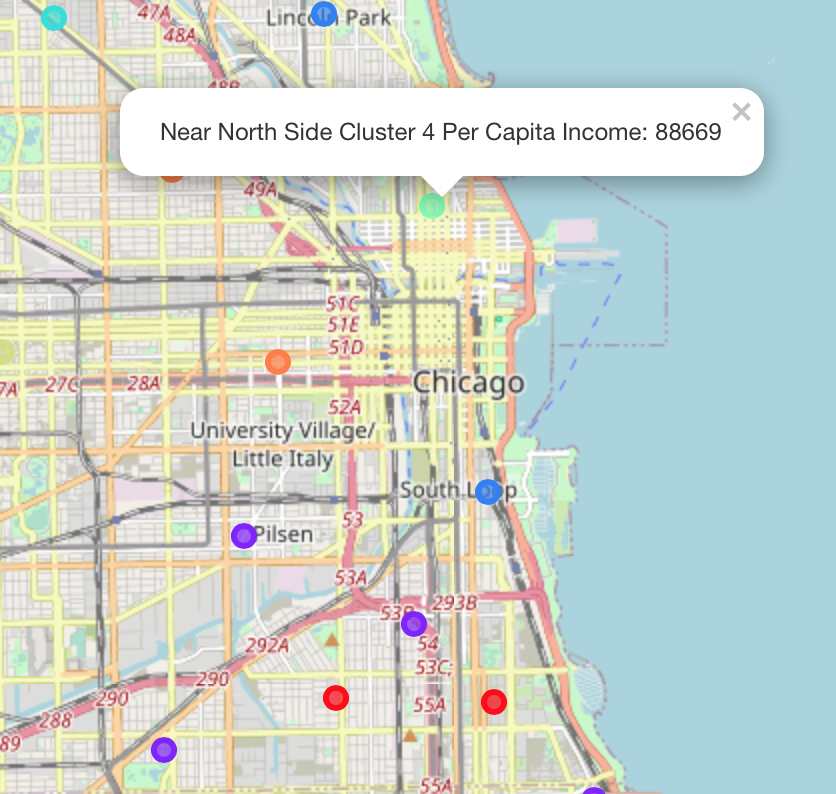

In [67]:
nf5.loc[nf5['Cluster Labels']==4,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
4,12.9,7.0,2.5,22.6,88669.0,1.0,72.105,10.8494,0.0982,10.1138,0.2336,1.6624,4.9376,4


In [68]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 4, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
7,Near North Side,12.9,7.0,2.5,22.6,88669,1.0,72.105,10.8494,0.0982,...,0.2336,1.6624,4.9376,-87.630686,41.897838,Hotel,Italian Restaurant,American Restaurant,Steakhouse,New American Restaurant


In [69]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 4, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
7,Near North Side,Hotel,Italian Restaurant,American Restaurant,Steakhouse,New American Restaurant


# Cluster 5 Analysis

<b> Analysis: </b> Cluster 5 is at a consequential lack of resources. The Per Capita Income is $6000 less than the next lowest Per Capita Income of any cluster. The cluster is also extremely geographically constrained. For the purposes of this project, this cluster would be the primary focus of both government and non-government organizations to provide assistance.

<b> Additional Analysis: </b> 

1. The population of this cluster is largely comprised by Blacks, with Hispanics/Latinos also making up an appreciable percentage of the population.

2. Not only is the Unemployment Rate extremely high, the Percent of Working Age Adults is relatively low. This could indicate that families are both young and plagued by unemployment.

<b> Cluster Definition: </b>

I would define this cluster as Lower Class, Black, in Critical Need, and South Side





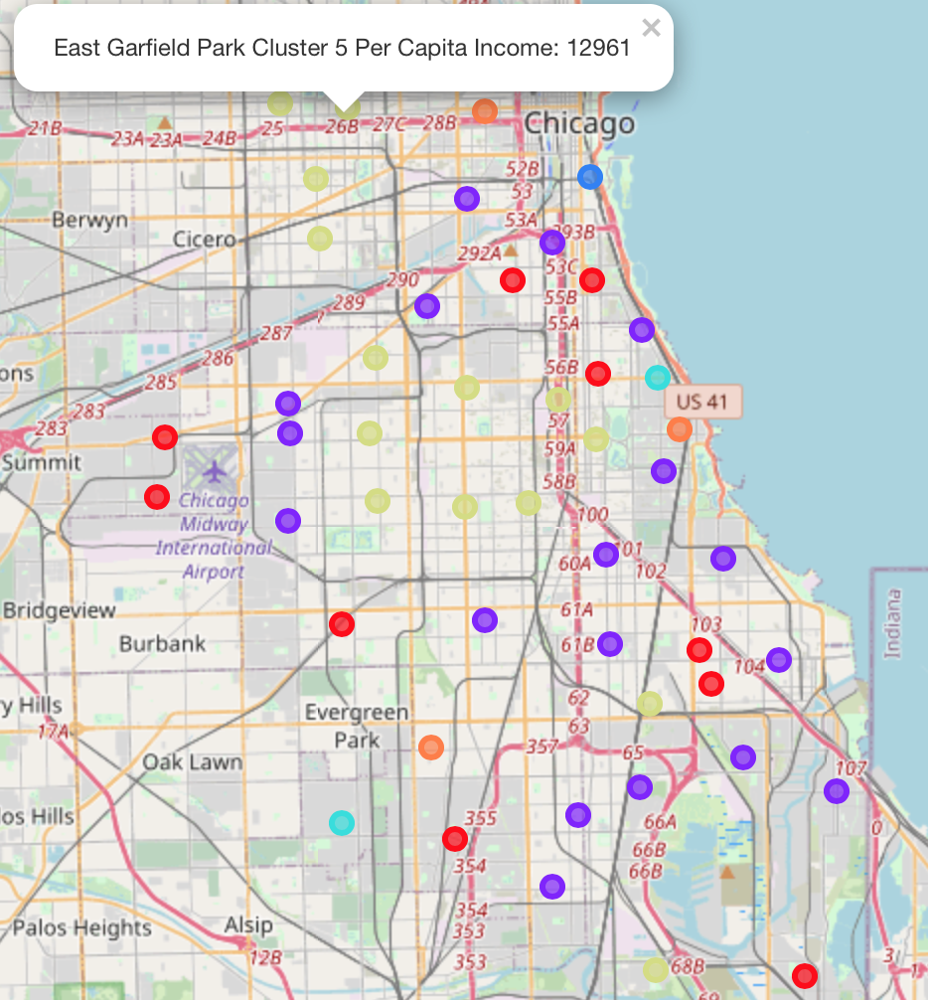

In [70]:
nf5.loc[nf5['Cluster Labels']==5,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
5,37.542857,23.871429,32.221429,41.857143,11837.5,89.357143,2.955629,68.149436,0.113621,0.613193,0.074507,0.734379,27.359243,5


In [71]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 5, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
23,West Garfield Park,41.7,25.8,24.5,43.6,10934,92.0,0.7388,96.1891,0.1222,...,0.0611,0.9111,1.9332,-87.727670,41.880154,Fast Food Restaurant,Train Station,Sandwich Place,Fried Chicken Joint,Shoe Store
24,East Garfield Park,42.4,19.6,21.3,43.2,12961,83.0,3.3938,90.9029,0.1167,...,0.0972,0.9530,4.1328,-87.704500,41.879195,Train Station,American Restaurant,Pharmacy,Sports Bar,Event Service
26,North Lawndale,43.1,21.2,27.6,42.7,12034,87.0,1.3700,91.4318,0.2172,...,0.0668,0.7379,5.9701,-87.715818,41.860835,Fast Food Restaurant,Liquor Store,Pop-Up Shop,Shoe Store,Cosmetics Shop
27,South Lawndale,30.7,15.8,54.8,33.8,10402,96.0,3.8543,13.0839,0.0795,...,0.1249,0.1589,82.5560,-87.713887,41.845357,Mexican Restaurant,Ice Cream Shop,Fast Food Restaurant,Pharmacy,Bank
33,Fuller Park,51.2,33.9,26.6,44.9,10432,97.0,1.6342,92.1766,0.0000,...,0.0000,1.3561,4.5897,-87.631659,41.804321,Women's Store,Park,Fried Chicken Joint,Bakery,BBQ Joint
36,Washington Park,42.1,28.6,25.4,42.8,13785,88.0,0.7425,97.0385,0.1109,...,0.0171,1.1010,0.8876,-87.618835,41.793611,Fast Food Restaurant,Pizza Place,Fried Chicken Joint,Train Station,Park
43,Burnside,33.0,18.6,19.3,42.7,12515,79.0,0.6516,97.7023,0.0686,...,0.0000,0.8916,0.6859,-87.600361,41.725473,Train Station,Park,Food Service,Liquor Store,Bus Station
50,Riverdale,56.5,34.6,27.5,51.5,8201,98.0,0.4937,96.4363,0.1080,...,0.0617,0.8331,2.0364,-87.597882,41.656910,Food,Garden,Grocery Store,Park,Women's Store
54,Brighton Park,23.6,13.9,45.1,39.3,13089,84.0,8.1159,1.1947,0.0882,...,0.0970,0.2535,85.2870,-87.694643,41.814910,Ice Cream Shop,Mexican Restaurant,Pizza Place,Liquor Store,Sandwich Place
57,New City,29.0,23.0,41.5,38.9,12765,91.0,10.5843,29.6280,0.1307,...,0.1239,0.5881,57.3067,-87.663461,41.807361,Mexican Restaurant,Fast Food Restaurant,Pizza Place,Grocery Store,Discount Store


In [72]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 5, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
23,West Garfield Park,Fast Food Restaurant,Train Station,Sandwich Place,Fried Chicken Joint,Shoe Store
24,East Garfield Park,Train Station,American Restaurant,Pharmacy,Sports Bar,Event Service
26,North Lawndale,Fast Food Restaurant,Liquor Store,Pop-Up Shop,Shoe Store,Cosmetics Shop
27,South Lawndale,Mexican Restaurant,Ice Cream Shop,Fast Food Restaurant,Pharmacy,Bank
33,Fuller Park,Women's Store,Park,Fried Chicken Joint,Bakery,BBQ Joint
36,Washington Park,Fast Food Restaurant,Pizza Place,Fried Chicken Joint,Train Station,Park
43,Burnside,Train Station,Park,Food Service,Liquor Store,Bus Station
50,Riverdale,Food,Garden,Grocery Store,Park,Women's Store
54,Brighton Park,Ice Cream Shop,Mexican Restaurant,Pizza Place,Liquor Store,Sandwich Place
57,New City,Mexican Restaurant,Fast Food Restaurant,Pizza Place,Grocery Store,Discount Store


# Cluster 6 Analysis

<b> Analysis: </b> On a high level it is clear to see that Cluster 6 is dispersed widely throughout the city. 

<b> Additional Observations </b> 

1. Cluster 6 leans towards being predominately White (~62%).

<b> Cluster Definition </b>

Cluster 6 can be defined as being Upper Middle Class, White, in Low Need, and no Geographic Constraint.



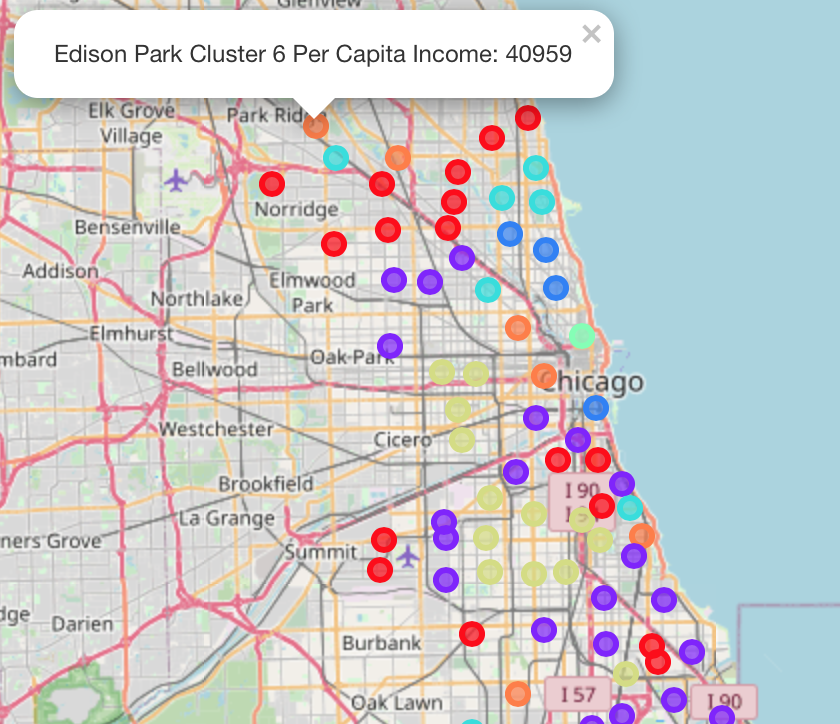

In [73]:
nf5.loc[nf5['Cluster Labels']==6,nf5.columns[list(range(0,nf5.shape[1]))]]

,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,Asian,Other,Two or More Races,Hispanic or Latino,Cluster Labels
Cluster Labels,,,,,,,,,,,,,,
6,11.6,7.833333,7.133333,31.066667,41931.5,11.666667,61.28765,17.479667,0.117467,7.41775,0.212483,2.077917,11.407067,6


In [74]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 6, neighborhoodfull.columns[list(range(1, neighborhoodfull.shape[1]))]]

,Neighborhood,Household Poverty Rate,Unofficial Unemployment Rate,Non-GED,Percent Children or Retirement Age,PER CAPITA INCOME,Hardship Index,White,Black,American Indian and Alaska Native,...,Other,Two or More Races,Hispanic or Latino,Longitude,Latitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
8,Edison Park,3.3,6.5,7.4,35.3,40959,8.0,88.3615,0.2592,0.0268,...,0.0805,1.0727,7.7948,-87.813459,42.005335,Italian Restaurant,Pizza Place,Park,Bar,Spa
11,Forest Glen,7.5,6.8,4.9,40.5,44164,11.0,74.6434,0.7402,0.1189,...,0.0864,2.1774,11.4869,-87.757509,41.988860,Trail,American Restaurant,Park,Indian Restaurant,Chinese Restaurant
21,West Town,14.7,6.6,12.9,21.7,43198,10.0,57.2146,7.7873,0.1471,...,0.2286,1.7815,29.0639,-87.675436,41.902424,Coffee Shop,Café,Sushi Restaurant,Taco Place,Spa
25,Near West Side,20.6,10.7,9.6,22.2,44689,15.0,41.9854,31.5282,0.1531,...,0.3098,2.2084,9.1981,-87.657063,41.878050,Coffee Shop,Italian Restaurant,Greek Restaurant,Pizza Place,Park
37,Hyde Park,18.4,8.4,4.3,26.2,39056,14.0,46.6960,30.4311,0.1441,...,0.3699,3.6252,6.3315,-87.589644,41.796310,Science Museum,Bookstore,Café,Pizza Place,Thai Restaurant
68,Beverly,5.1,8.0,3.7,40.5,39523,12.0,58.8250,34.1320,0.1148,...,0.1997,1.6023,4.5672,-87.675537,41.714674,Pizza Place,Cosmetics Shop,Sandwich Place,Bakery,Mobile Phone Shop


In [75]:
neighborhoodfull.loc[neighborhoodfull['Cluster Labels'] == 6, neighborhoodfull.columns[list([1,17,18,19,20,21])]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
8,Edison Park,Italian Restaurant,Pizza Place,Park,Bar,Spa
11,Forest Glen,Trail,American Restaurant,Park,Indian Restaurant,Chinese Restaurant
21,West Town,Coffee Shop,Café,Sushi Restaurant,Taco Place,Spa
25,Near West Side,Coffee Shop,Italian Restaurant,Greek Restaurant,Pizza Place,Park
37,Hyde Park,Science Museum,Bookstore,Café,Pizza Place,Thai Restaurant
68,Beverly,Pizza Place,Cosmetics Shop,Sandwich Place,Bakery,Mobile Phone Shop


# Conclusion


I believe that it is clear to see from analysis of these different clusters that Chicago is indeed highly segregated, which can particularly be seen in the difference between the North Side and South Side of Chicago. Specific parts of the North Side are White, Upper Class, and not in any Need. This does not necessarily remain true for the South Side. It should also be stated that the neighborhoods of mainly Black and Hispanic or Latino communities are plainly less well to do economically than their counterparts. This is apparent by analyzing the rates of unemployment, Non-GEDs, household poverty, etc. The dramatically lower Per Capita Income is also quite telling.

I also believe that the venues that are present in neighborhoods can help to further segment them. It is clear that by looking at Cluster 1 and Cluster 5, which are the two clusters that seem to be most in need, that the venues that are the most common tend to differ dramatically from Cluster 2, Cluster 3, and Cluster 6. However, I doubt that the answer to the woes of Cluster 1 and Cluster 5 would simply be for there to be more Coffee Shops and Cafes. Yet, it is important to understand the lived experiences of the individuals that reside in these clusters as it relates to the venues that they have access to. 

In conclusion, it is important that government and non-government organizations have access to analysis such as this. I know that it will be helpful in determining the ways that solutions can be reached in assisting neighborhoods in need. These solutions will have to be nuanced, with the understanding that what may work for one neighborhood is not what will work for another. That is why this segmenting project is important, as it may provide a foundation to understanding the situation at hand in Chicago.